# Personal Information
Name: **Thijs Clowting**

StudentID: **14025213**

Email: [**thijs.clowting@student.uva.nl**](youremail@student.uva.nl)

Submitted on: **19.03.2023**

GitHub Repository: **https://github.com/Clowting/fireworks-birds**

# Data Context
**Between December 30, 2022, and January 8, 2023, audio data has been collected in four 1-kilometer transects using 36 recording devices in total. GBIF data will be used to determine bird species active in these areas. Additionally, bird song audio data from Xeno Canto will be used for training.**

# Data Description
For the birds in the GBIF data set, audio is collected from Xeno Canto. To get an idea of the origin of this audio data, it is plotted on a map. We use librosa to experiment with the audio data itself. The data load code is also available.

In [3]:
import subprocess
import librosa
import librosa.display
import numpy as np
import pandas as pd
# import geopandas
# import folium
# from folium.plugins import MarkerCluster, BeautifyIcon
import matplotlib.pyplot as plt
import IPython.display as ipd
import duckdb
import logging
import random

logging.basicConfig(filename='app.log', filemode='w', format='%(name)s - %(levelname)s - %(message)s')

In [7]:
# Connect to Duck DB database file
con = duckdb.connect('data/db/collection.duckdb')

In [3]:
# audio_path = 'data/recordings/20230101_143000.WAV'
audio_path = 'data/audio/aegithalos_caudatus/XC101371 - Long-tailed Tit - Aegithalos caudatus europaeus.mp3'

sr = librosa.get_samplerate(audio_path)
x , sr = librosa.load(audio_path)

In [4]:
ipd.Audio(audio_path)

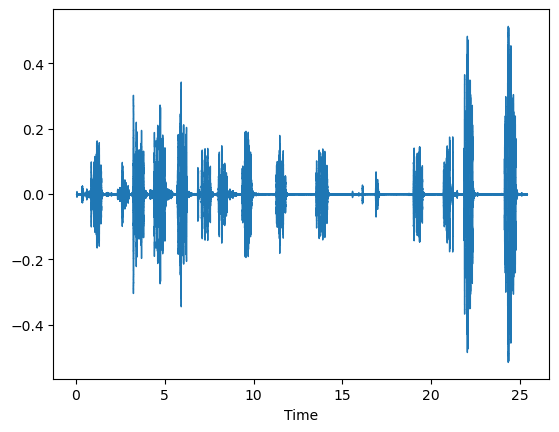

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [5]:
librosa.display.waveshow(x, sr=sr)

In [19]:
import numpy as np
import soundfile as sf
import librosa

# Load audio file as a generator
audio_file = 'data/recordings/20230102_000001.WAV'
sr = librosa.get_samplerate(audio_file)
stream = librosa.stream(audio_file, block_length=512, frame_length=2048, hop_length=512)

# Process audio in chunks and remove silence
non_silent_audio = []
for chunk in stream:
    intervals = librosa.effects.split(chunk, top_db=20)
    non_silent_chunk = np.concatenate([chunk[start:end] for start, end in intervals])
    non_silent_audio.append(non_silent_chunk)

non_silent_audio = np.concatenate(non_silent_audio)        

# Save non-silent audio to file
non_silent_audio_file = 'data/test.wav'
sf.write(non_silent_audio_file, non_silent_audio, sr)

In [22]:
from pydub import AudioSegment, silence

# Load audio file
audio_file = 'data/recordings/20230102_000001.WAV'
audio = AudioSegment.from_file(audio_file)

# Detect non-silent parts of audio
non_silent_intervals = silence.detect_nonsilent(audio, min_silence_len=1000, silence_thresh=-60)

# Extract non-silent parts of audio and concatenate them
non_silent_audio = AudioSegment.empty()
for interval in non_silent_intervals:
    non_silent_audio += audio[interval[0]:interval[1]]

# Save non-silent audio to file
non_silent_audio_file = 'data/test2.wav'
non_silent_audio.export(non_silent_audio_file, format='wav')

<_io.BufferedRandom name='data/test2.wav'>

In [16]:
print(non_silent_audio)

[-0.00167847  0.00268555  0.00244141 ...  0.00054932  0.0010376
  0.00762939]


In [9]:
con.sql('''
    SELECT
        *
    FROM
        bird_observations_ede
    WHERE
        species LIKE 'Certhia%'
''').to_df()

,species,search_key,observation_sum,observation_cnt
0,Certhia brachydactyla,certhia+brachydactyla,207.0,152


In [238]:
locations = con.sql('''
    SELECT
        REPLACE(search_key, '+', '_') AS species_key,
        REPLACE(search_key, '+', ' ') AS species_name,
        cnt,
        lat,
        lng
    FROM
        bird_recordings
''').to_df()

countries = con.sql('''
    SELECT DISTINCT
        cnt
    FROM
        bird_recordings
    WHERE
        lat IS NOT NULL AND
        lng IS NOT NULL
''').to_df()

species = con.sql('''
    SELECT DISTINCT
        REPLACE(search_key, '+', '_') AS species_key,
        REPLACE(search_key, '+', ' ') AS species_name,
    FROM
        bird_recordings
    GROUP BY
        species_key,
        species_name
''').to_df()

In [239]:
locations = locations.dropna()

In [240]:
species['color'] = species.apply(lambda x: "#%06x" % random.randint(0, 0xFFFFFF), axis=1).astype('str')

In [245]:
# Make an empty map
m = folium.Map(location=[20,0], tiles="OpenStreetMap", zoom_start=2)

marker_clusters = {}

In [246]:
# Add marker clusters per country
for index, row in countries.iterrows():
    marker_clusters[row['cnt']] = MarkerCluster(name=row['cnt']).add_to(m)

In [247]:
# Add markers to clusters
for index, row in locations.iterrows():
    location = row['lat'], row['lng']
    color = species.loc[species['species_key'] == row['species_key']]['color'].to_string(index=False)
    icon = BeautifyIcon(text_color='#fff', background_color=color, icon='music', border_width=0)
    marker = folium.Marker(location=location, icon=icon)
    # marker.add_to(m)
    marker_clusters[row['cnt']].add_child(marker)

In [74]:
# gdf = geopandas.GeoDataFrame(
#     df, geometry=geopandas.points_from_xy(df.lng, df.lat))

In [75]:
# for index, row in df.iterrows():
#     folium.CircleMarker([row["lat"], row["lng"]]).add_to(m)

In [150]:
# folium.LayerControl().add_to(m)

In [248]:
# Show map
m

## Map of recording locations

In [3]:
locations = pd.read_csv('data/recordings/coordinates_kerkhoflaan.csv')
locations

,waypoint,sensor,lon,lat
0,43,1_041_209,5.674196,52.054263
1,44,2_026_210,5.674418,52.054681
2,45,3_018_211,5.674631,52.055118
3,46,4_049_212,5.674573,52.055470
4,47,5_008_213,5.674985,52.056030
5,48,6_002_214,5.675310,52.056807
6,49,7_023_215,5.675918,52.057996
7,56,8_032_216,5.676546,52.059224
8,85,9_035_217,5.676911,52.061051


In [4]:
loc_mean = locations[['lon', 'lat']].mean()

In [5]:
# Make an empty map
m = folium.Map(location=[loc_mean['lat'], loc_mean['lon']], tiles="OpenStreetMap", zoom_start=16)

In [6]:
# Add markers to map
for index, row in locations.iterrows():
    location = row['lat'], row['lon']
    number = row['sensor'][0]
    icon = BeautifyIcon(text_color='#fff', background_color='#000', icon='microphone', border_width=0, number=number)
    marker = folium.Marker(location=location, icon=icon)
    marker.add_to(m)

In [7]:
m

In [32]:
m.save('data/map.html')

## Save audio fragments for validation

In [12]:
uncommon_obs = con.sql('''
    SELECT
        time,
        time_m5,
        time_p5,
        class,
        SCI_NAME AS name,
        'data/output/' || REPLACE(time, ':', '_') || '_' || LOWER(REPLACE(SCI_NAME, ' ', '_')) || '.ogg' AS file
    FROM
        uncommon_obs_ede AS ub
''').to_df()

uncommon_obs

,time,time_m5,time_p5,class,name,file
0,0:10:30,00:10:25,00:10:35,eurtre1,Certhia familiaris,data/output/0_10_30_certhia_familiaris.ogg
1,0:28:40,00:28:35,00:28:45,pifgoo,Anser brachyrhynchus,data/output/0_28_40_anser_brachyrhynchus.ogg
2,0:28:45,00:28:40,00:28:50,pifgoo,Anser brachyrhynchus,data/output/0_28_45_anser_brachyrhynchus.ogg
3,0:28:55,00:28:50,00:29:00,pifgoo,Anser brachyrhynchus,data/output/0_28_55_anser_brachyrhynchus.ogg
4,0:53:05,00:53:00,00:53:10,brncre,Certhia americana,data/output/0_53_05_certhia_americana.ogg


In [14]:
for index, row in uncommon_obs.iterrows():
    sp = subprocess.Popen(['ffmpeg', '-copyts', '-ss', row['time_m5'], '-i', 'data/recordings/20230101_143000_1h.ogg', '-to', row['time_p5'], '-c', 'copy', row['file']])
    sp.wait()

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with clang version 14.0.6
  configuration: --prefix=/Users/runner/miniforge3/conda-bld/ffmpeg_1674566297840/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_pl --cc=x86_64-apple-darwin13.4.0-clang --cxx=x86_64-apple-darwin13.4.0-clang++ --nm=x86_64-apple-darwin13.4.0-nm --ar=x86_64-apple-darwin13.4.0-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --disable-videotoolbox --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libopus --pkg-config=/Users/runner/miniforge3/co

In [8]:
validation_obs = con.sql('''
    SELECT
        cv.*,
        CASE
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '00:00:00' AND '00:29:55' THEN 0
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '06:00:00' AND '08:59:55' THEN 360
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '14:30:00' AND '17:29:55' THEN 870
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '21:30:00' AND '23:59:55' THEN 1290
        END AS time_correction,
        
        'data/recordings/ogg_files/' || sensor ||
        CASE
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '00:00:00' AND '00:29:55' THEN '/20230103_000001.ogg'
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '06:00:00' AND '08:59:55' THEN '/20230103_060000.ogg'
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '14:30:00' AND '17:29:55' THEN '/20230103_143000.ogg'
            WHEN CAST(start_observation_dt AS TIME) BETWEEN '21:30:00' AND '23:59:55' THEN '/20230103_213000.ogg'
        END AS input_file,
        'data/output/validation/' || id || '.ogg' AS output_file,
        'https://ebird.org/species/' || class || '?siteLanguage=nl' AS url
    FROM
        classification_validation AS cv
    ORDER BY
        id
''').to_df()

validation_obs['start_time'] = (validation_obs['start_observation_dt'] - validation_obs['time_correction'].astype('timedelta64[m]')).dt.strftime('%H:%M:%S')
validation_obs['end_time'] = (validation_obs['end_observation_dt'] - validation_obs['time_correction'].astype('timedelta64[m]')).dt.strftime('%H:%M:%S')

validation_obs.to_clipboard()
validation_obs

,id,sensor,start_observation_dt,end_observation_dt,class,scientific_name,not_in_NL_ind,probability,probability_rank,time_correction,input_file,output_file,url,start_time,end_time
0,1,1_041_209,2023-01-03 16:06:55,2023-01-03 16:07:00,eurbla,Turdus merula,0,0.455,1,870,data/recordings/ogg_files/1_041_209/20230103_1...,data/output/validation/1.ogg,https://ebird.org/species/eurbla?siteLanguage=nl,01:36:55,01:37:00
1,2,9_035_217,2023-01-03 07:06:50,2023-01-03 07:06:55,winwre4,Troglodytes troglodytes,0,0.999,1,360,data/recordings/ogg_files/9_035_217/20230103_0...,data/output/validation/2.ogg,https://ebird.org/species/winwre4?siteLanguage=nl,01:06:50,01:06:55
2,3,1_041_209,2023-01-03 08:49:55,2023-01-03 08:50:00,gretit1,Parus major,0,0.362,1,360,data/recordings/ogg_files/1_041_209/20230103_0...,data/output/validation/3.ogg,https://ebird.org/species/gretit1?siteLanguage=nl,02:49:55,02:50:00
3,4,1_041_209,2023-01-03 23:20:00,2023-01-03 23:20:05,jacsni,Lymnocryptes minimus,0,0.352,1,1290,data/recordings/ogg_files/1_041_209/20230103_2...,data/output/validation/4.ogg,https://ebird.org/species/jacsni?siteLanguage=nl,01:50:00,01:50:05
4,5,1_041_209,2023-01-03 08:46:15,2023-01-03 08:46:20,shttre1,Certhia brachydactyla,0,0.862,1,360,data/recordings/ogg_files/1_041_209/20230103_0...,data/output/validation/5.ogg,https://ebird.org/species/shttre1?siteLanguage=nl,02:46:15,02:46:20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,296,9_035_217,2023-01-03 16:08:30,2023-01-03 16:08:35,eurbla,Turdus merula,0,0.857,1,870,data/recordings/ogg_files/9_035_217/20230103_1...,data/output/validation/296.ogg,https://ebird.org/species/eurbla?siteLanguage=nl,01:38:30,01:38:35
296,297,9_035_217,2023-01-03 07:09:05,2023-01-03 07:09:10,redwin,Turdus iliacus,0,0.998,1,360,data/recordings/ogg_files/9_035_217/20230103_0...,data/output/validation/297.ogg,https://ebird.org/species/redwin?siteLanguage=nl,01:09:05,01:09:10
297,298,9_035_217,2023-01-03 15:22:15,2023-01-03 15:22:20,comcha,Fringilla coelebs,0,0.831,1,870,data/recordings/ogg_files/9_035_217/20230103_1...,data/output/validation/298.ogg,https://ebird.org/species/comcha?siteLanguage=nl,00:52:15,00:52:20
298,299,9_035_217,2023-01-03 07:51:55,2023-01-03 07:52:00,lottit1,Aegithalos caudatus,0,0.389,1,360,data/recordings/ogg_files/9_035_217/20230103_0...,data/output/validation/299.ogg,https://ebird.org/species/lottit1?siteLanguage=nl,01:51:55,01:52:00


In [42]:
for index, row in validation_obs.iterrows():
    sp = subprocess.Popen(['ffmpeg', '-copyts', '-ss', row['start_time'], '-i', row['input_file'], '-to', row['end_time'], '-c', 'copy', row['output_file']])
    sp.wait()

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with clang version 4.0.1 (tags/RELEASE_401/final)
  configuration: --prefix=/opt/concourse/worker/volumes/live/d5b9ea1c-8223-4ff6-7416-83e6b4cd6874/volume/ffmpeg_1587154914508/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehol --cc=x86_64-apple-darwin13.4.0-clang --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilt

In [9]:
con.close()